In [70]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import keras
from keras.preprocessing import image
from tensorflow.keras import Sequential
from keras.layers import Dense,GlobalAveragePooling2D,Conv2D,LeakyReLU,Flatten,Dropout,Reshape,Conv2DTranspose
from tensorflow.keras.applications.mobilenet import MobileNet
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import glob
from numpy.random import randint,randn
from numpy import ones,zeros

In [71]:
def load_imgs(files,target_size,interpolation):
  all_imgs = []
  for file in files:
    img = image.load_img(file,target_size = target_size,interpolation = interpolation)
    img = image.img_to_array(img).astype("float32") #ทำ Normalize ให้เป็น -1 - 1
    img = scale(img,out_range = (-1,1),domain = (0,255))
    all_imgs.append(img)
  all_imgs = np.array(all_imgs)
  return all_imgs

In [72]:
def scale(x, out_range=(-1, 1), domain = (0,1)):
    domain = domain
    y = (x - (domain[1] + domain[0]) / 2) / (domain[1] - domain[0])
    return y * (out_range[1] - out_range[0]) + (out_range[1] + out_range[0]) / 2

In [73]:
# read image from dataset and resize to train_dataset.shape = img_size using interpolation="bilinear"
# rescale train_dataset values [0, 255] -> [-1, 1]
img_size = (32, 32, 3)
filenames= glob.glob("image/*/*/*.jpg")
print(len(filenames))
#train_dataset = load_real_samples()
train_dataset = load_imgs(filenames,img_size,"bilinear")



3075


In [74]:
print(train_dataset[0])

[[[ 0.58431375  0.5764706   0.56078434]
  [ 0.42745098  0.41960785  0.40392157]
  [ 0.33333334  0.31764707  0.3019608 ]
  ...
  [ 0.01176471 -0.00392157 -0.00392157]
  [ 0.3647059   0.35686275  0.3647059 ]
  [ 0.5529412   0.54509807  0.5529412 ]]

 [[ 0.21568628  0.20784314  0.19215687]
  [-0.00392157 -0.01960784 -0.02745098]
  [-0.08235294 -0.09019608 -0.10588235]
  ...
  [-0.52156866 -0.5372549  -0.54509807]
  [ 0.09803922  0.09803922  0.09803922]
  [ 0.4509804   0.44313726  0.44313726]]

 [[ 0.18431373  0.1764706   0.16078432]
  [-0.01176471 -0.01960784 -0.02745098]
  [-0.04313726 -0.05098039 -0.05882353]
  ...
  [-0.6392157  -0.64705884 -0.654902  ]
  [-0.12941177 -0.13725491 -0.13725491]
  [ 0.37254903  0.3647059   0.3647059 ]]

 ...

 [[ 0.4745098   0.45882353  0.44313726]
  [-0.01960784 -0.02745098 -0.04313726]
  [-0.07450981 -0.09019608 -0.09019608]
  ...
  [-0.13725491 -0.13725491 -0.13725491]
  [-0.12156863 -0.12156863 -0.12156863]
  [ 0.12941177  0.12941177  0.12941177]]

 [

In [75]:
# Random Selected images check
def generate_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples) # random image index
    # retrieve selected images
    X = dataset[ix] # get image from random pick ix
    # generate y = 1 for 'real' class labels
    y = ones((n_samples, 1))#-> (y.shape = (n_samples,1))
    return X, y



In [76]:
#check
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    #print(f"X_input = {x_input.shape}")
    return x_input

Text(0.5, 1.0, 'x_real2')

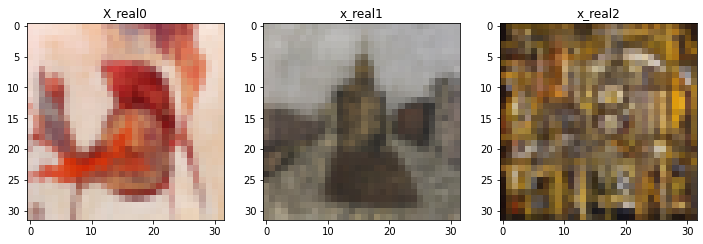

In [77]:
X_real, y_real = generate_real_samples(train_dataset, n_samples = 3)
X_real = scale(X_real,domain = (-1,1),out_range = (0,255))

# Display Random Real Images
plt.figure(figsize=(12,7))
plt.subplot(1,3,1)
plt.imshow(X_real[0].astype("uint8"))
plt.title('X_real0')
plt.subplot(1,3,2)
plt.imshow(X_real[1].astype("uint8"))
plt.title('x_real1')
plt.subplot(1,3,3)
plt.imshow(X_real[2].astype("uint8"))
plt.title('x_real2')

In [78]:
#not check
def generate_fake_samples(n_samples, target_size=(32,32,3)):
    h,w,c = target_size
    # generate 1D uniform random numbers in [0,1]
    #-> X.shape = (n_samples * h * w * 3)
    X = np.random.rand(n_samples*h*w*c)
    X = scale(X,domain = (0,1) ,out_range = (-1,1)) # rescale X value from [0, 1] to [-1, 1]
    X = X.reshape((n_samples,h,w,c)) # reshape X from 1D to 4D
    # generate y = 0 for 'fake' class label
    #y # y.shape = (n_samples,1)
    y = zeros((n_samples, 1))#-> (y.shape = (n_samples,1))
    return X,y

In [79]:
a,b = generate_fake_samples(5)

Text(0.5, 1.0, 'X_fake2')

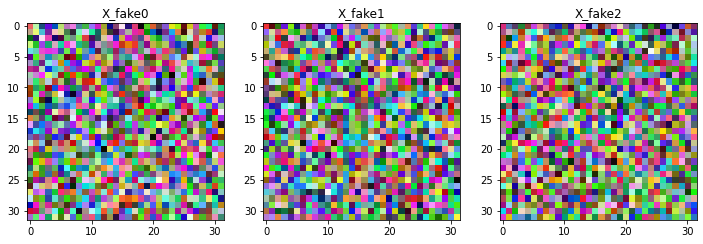

In [80]:
# generate fake image samples
X_fake, y_fake = generate_fake_samples(3, target_size=img_size)
X_fake = scale(X_fake,out_range = (0,255))

#Display Random Real Images

plt.figure(figsize=(12,7))
plt.subplot(1,3,1)
plt.imshow(X_fake[0].astype("uint8"))
plt.title('X_fake0')
plt.subplot(1,3,2)
plt.imshow(X_fake[1].astype("uint8"))
plt.title('X_fake1')
plt.subplot(1,3,3)
plt.imshow(X_fake[2].astype("uint8"))
plt.title('X_fake2')

In [81]:
# Discriminator Model check
def define_discriminator(in_shape=(32,32,3)):
    model = Sequential()
    # normal
    #32-29+1
    model.add(Conv2D(128, (3,3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(64, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(64, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss= 'binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [82]:
#train the discriminator model
def train_discriminator(model, dataset, n_iter=128, n_batch=256, target_size=(32,32,3)):
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_iter):
        # get randomly selected 'real' samples
        X_real, y_real = generate_real_samples(dataset, half_batch)
        # update discriminator on real samples
        _, real_acc = model.train_on_batch(X_real, y_real)
        # generate 'fake' examples
        X_fake, y_fake = generate_fake_samples(half_batch, target_size=img_size)
        # update discriminator on fake samples
        _, fake_acc = model.train_on_batch(X_fake, y_fake)
        # summarize performance
        print(real_acc, fake_acc)

In [83]:
d_model = define_discriminator(img_size)

In [84]:
d_model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 32, 32, 128)       3584      
                                                                 
 leaky_re_lu_20 (LeakyReLU)  (None, 32, 32, 128)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 16, 16, 128)       147584    
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 16, 16, 128)       0         
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 64)          73792     
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 8, 8, 64)          0         
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 64)         

In [85]:
train_discriminator(d_model, train_dataset, target_size = img_size)

0.6015625 0.046875
0.921875 0.1171875
0.96875 0.3125
0.984375 0.5390625
0.9765625 0.734375
0.9296875 0.90625
0.9375 0.96875
0.9765625 1.0
0.9375 1.0
0.9453125 1.0
0.953125 1.0
0.921875 1.0
0.9453125 1.0
0.96875 1.0
0.9609375 1.0
0.9375 1.0
0.9921875 1.0
0.9765625 1.0
0.9765625 1.0
1.0 1.0
0.9921875 1.0
0.9765625 1.0
0.9765625 1.0
0.9921875 1.0
0.9921875 1.0
0.984375 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.984375 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
0.9921875 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.0 1.0
1.

In [86]:
# define the standalone generator model check

def define_generator(latent_dim, discr_out = (256,4,4)):
    model = Sequential()
    # foundation for 4x4 image
    c, w, h = discr_out
    n_nodes = c * w * h
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((w, h, c)))
    # upsample to 8x8
    model.add(Conv2DTranspose(128, (w,h), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 16x16
    model.add(Conv2DTranspose(128, (w,h), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(128, (w,h), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer
    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
    return model

In [87]:
#define the generator model
g_model = define_generator(latent_dim = 100, discr_out = (256,4,4))

In [88]:
g_model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 4096)              413696    
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 4096)              0         
                                                                 
 reshape_3 (Reshape)         (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 8, 8, 128)        524416    
 ranspose)                                                       
                                                                 
 leaky_re_lu_25 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 16, 16, 128)      262272    
 Transpose)                                           

In [89]:
#define the combined generator and discriminator model, for updating the generator check
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

In [90]:
# update generate fake image using generator prediction
# use the generator to generate n fake examples, with class labels Check
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = zeros((n_samples, 1))#-> (y.shape = (n_samples,1))
    return X, y

In [91]:
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=128):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            d_loss1, _ = d_model.train_on_batch(X_real, y_real) # update discriminator model weights
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake) # update discriminator model weights
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            y_gan = ones((n_batch, 1)) # # create inverted labels for the fake samples y = 0 with shape (n_batch, )
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            #print(d_loss1, d_loss2, g_loss) # summarize loss on this batch
            # evaluate the model performance, every Nepoch
            if (i+1) % n_epochs == 0:
                summarize_performance(i, g_model, d_model, dataset, latent_dim)

In [99]:
# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
    # prepare real samples
    X_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print(acc_real , acc_fake)
    # save plot
    save_plot(x_fake, epoch)
    # save the generator model tile file
    filename = 'generator_model_%03d.h5' % (epoch+1)
    g_model.save(filename)

In [93]:

def save_plot(examples, epoch, n=5):
# plot images
    plt.figure(figsize=(16,9))
    examples = scale(examples,out_range = (0,255),domain = (-1,1)).astype("uint8")
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        plt.imshow(examples[i])

In [94]:
# create the gan
gan_model = define_gan(g_model, d_model)
# summarize gan model
gan_model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_9 (Sequential)   (None, 32, 32, 3)         1466115   
                                                                 
 sequential_8 (Sequential)   (None, 1)                 262913    
                                                                 
Total params: 1,729,028
Trainable params: 1,466,115
Non-trainable params: 262,913
_________________________________________________________________


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 4ms/step


2/2 [==============================] - 0s 4ms/step


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 6ms/step


2/2 [==============================] - 0s 5ms/step


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 4ms/step


2/2 [==============================] - 0s 4ms/step


2/2 [==============================] - 0s 4ms/step


2/2 [==============================] - 0s 3ms/step


2/2 [==============================] - 0s 4ms/step


5/5 [==============================] - 0s 3ms/step
0.3933333456516266 0.8333333134651184
5/5 [==============================] - 0s 4ms/step
0.4533333480358124 0.8600000143051147
5/5 [==============================] - 0s 6ms/step
0.4266666769981384 0.8199999928474426
5/5 [==============================] - 0s 4ms/step
0.5066666603088379 0.7200000286102295


5/5 [==============================] - 0s 4ms/step
0.5 0.8066666722297668
5/5 [==============================] - 0s 4ms/step
0.4933333396911621 0.800000011920929
5/5 [==============================] - 0s 6ms/step
0.6133333444595337 0.8199999928474426
5/5 [==============================] - 0s 4ms/step
0.41999998688697815 0.746666669845581
5/5 [==============================] - 0s 6ms/step
0.46000000834465027 0.7799999713897705
5/5 [==============================] - 0s 5ms/step
0.4399999976158142 0.7799999713897705
5/5 [==============================] - 0s 4ms/step
0.4266666769981384 0.8333333134651184
5/5 [==============================] - 0s 4ms/step
0.35333332419395447 0.8666666746139526
5/5 [==============================] - 0s 4ms/step
0.4933333396911621 0.8733333349227905
5/5 [==============================] - 0s 5ms/step
0.3799999952316284 0.8533333539962769
5/5 [==============================] - 0s 5ms/step
0.4266666769981384 0.8600000143051147
5/5 [==============================

C:\Users\ryu\AppData\Local\Temp\ipykernel_18208\100393139.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,9))


5/5 [==============================] - 0s 5ms/step
0.41999998688697815 0.9200000166893005
5/5 [==============================] - 0s 4ms/step
0.3266666531562805 0.9133333563804626
5/5 [==============================] - 0s 4ms/step
0.3199999928474426 0.9333333373069763


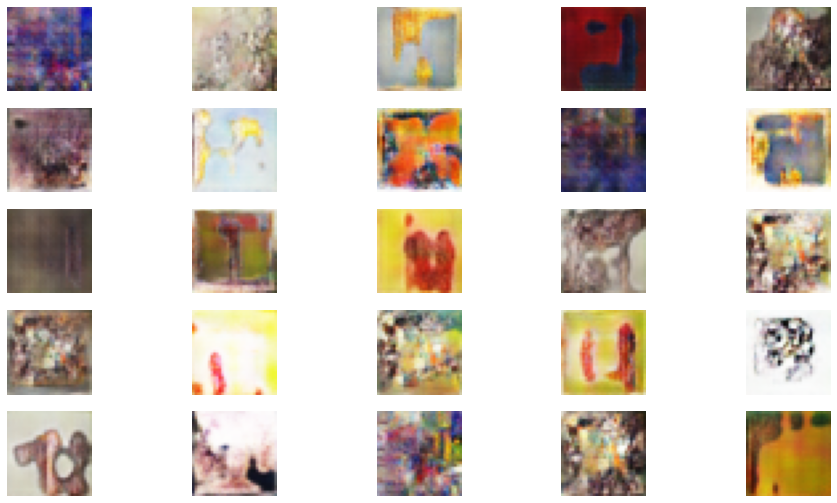

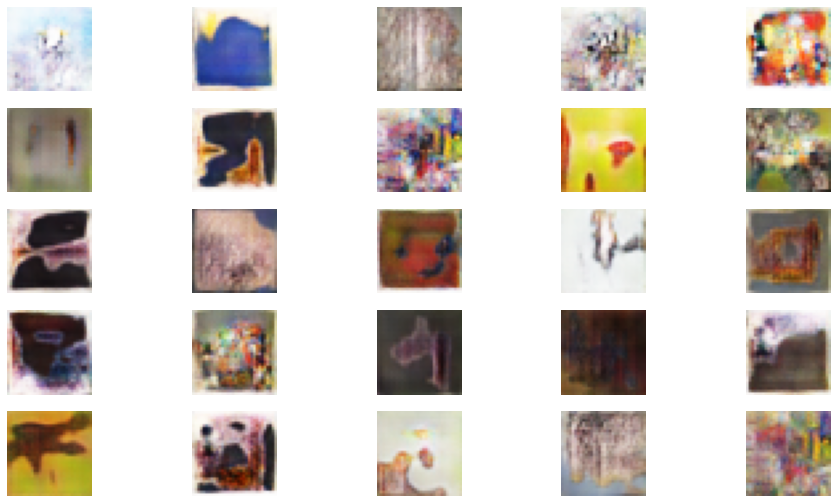

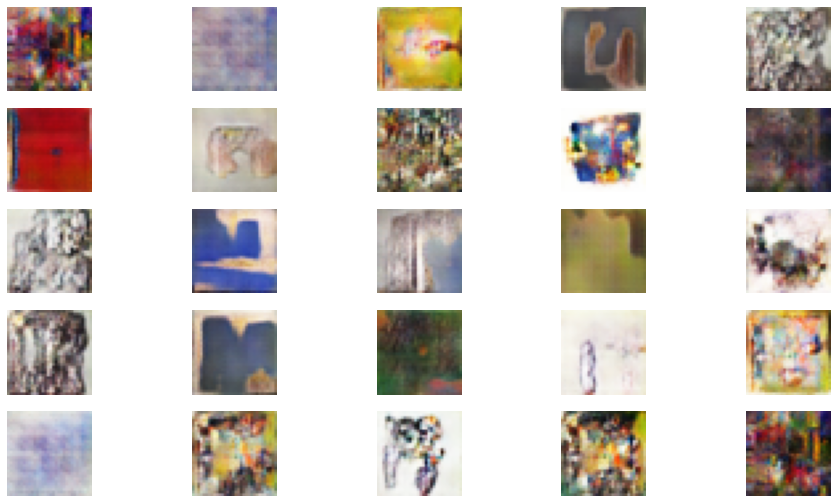

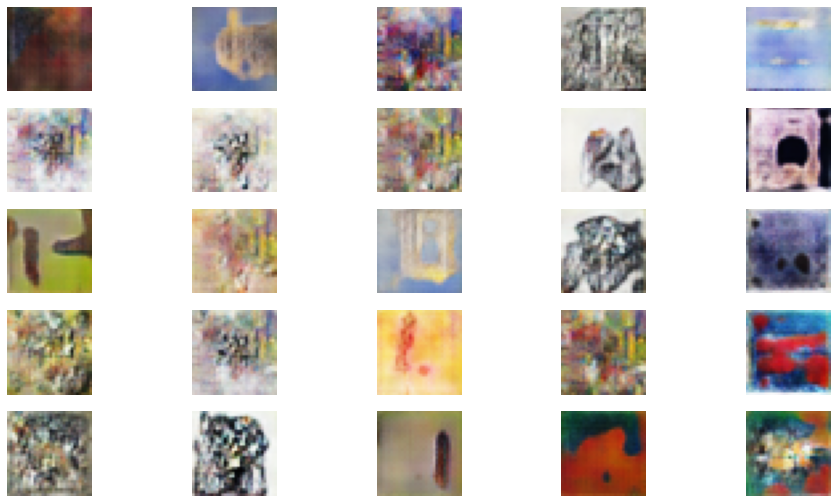

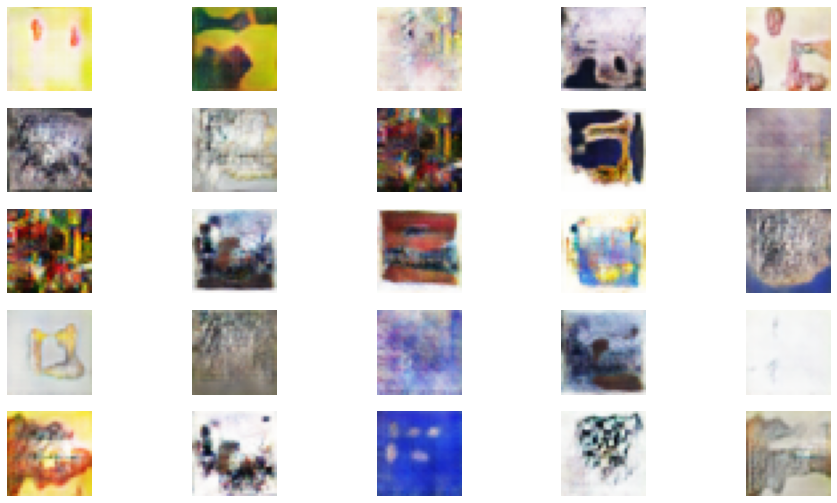

...

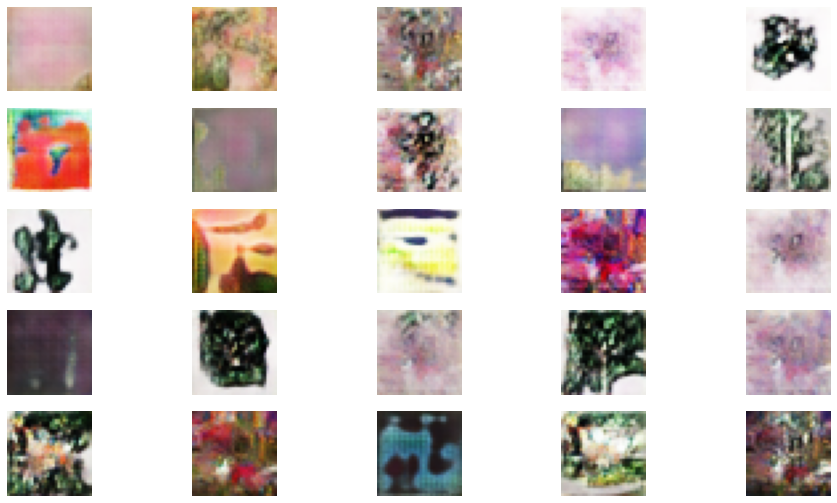

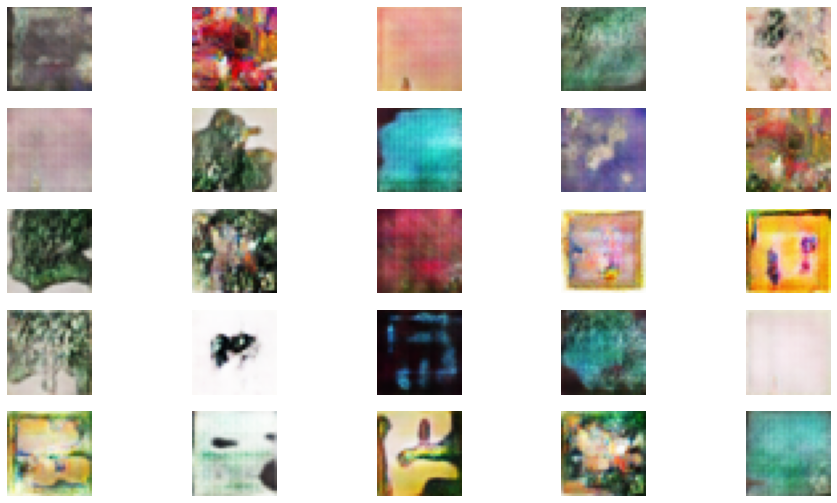

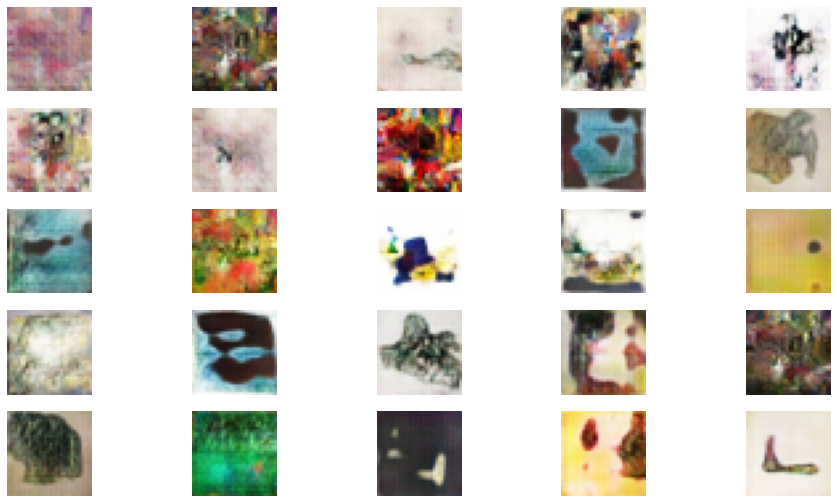

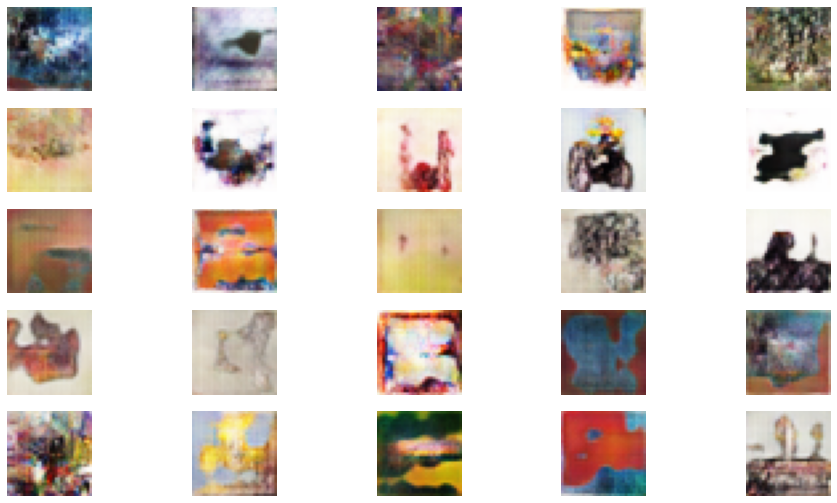

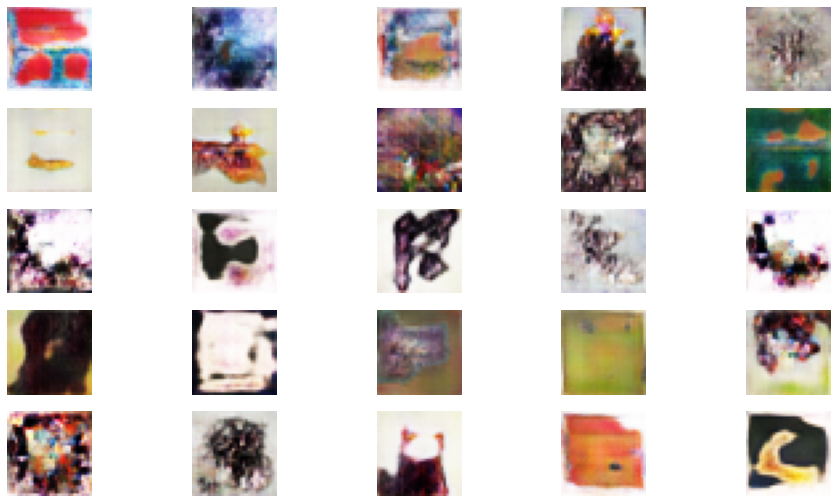

In [101]:
# train model
train(g_model, d_model, gan_model, train_dataset, latent_dim = 100)

In [ ]:
# example of training an conditional gan on the fashion mnist dataset
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from keras.datasets.fashion_mnist import load_data
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import Concatenate

# define the standalone discriminator model
def define_discriminator(in_shape=(28,28,1), n_classes=10):
    # label input
    in_label = Input(shape=(1,))
    # embedding for categorical input
    li = Embedding(n_classes, 50)(in_label)
    # scale up to image dimensions with linear activation
    n_nodes = in_shape[0] * in_shape[1]
    li = Dense(n_nodes)(li)
    # reshape to additional channel
    li = Reshape((in_shape[0], in_shape[1], 1))(li)
    # image input
    in_image = Input(shape=in_shape)
    # concat label as a channel
    merge = Concatenate()([in_image, li])
    # downsample
    fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(merge)
    fe = LeakyReLU(alpha=0.2)(fe)
    # downsample
    fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(fe)
    fe = LeakyReLU(alpha=0.2)(fe)
    # flatten feature maps
    fe = Flatten()(fe)
    # dropout
    fe = Dropout(0.4)(fe)
    # output
    out_layer = Dense(1, activation='sigmoid')(fe)
    # define model
    model = Model([in_image, in_label], out_layer)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

# define the standalone generator model
def define_generator(latent_dim, n_classes=10):
    # label input
    in_label = Input(shape=(1,))
    # embedding for categorical input
    li = Embedding(n_classes, 50)(in_label)
    # linear multiplication
    n_nodes = 7 * 7
    li = Dense(n_nodes)(li)
    # reshape to additional channel
    li = Reshape((7, 7, 1))(li)
    # image generator input
    in_lat = Input(shape=(latent_dim,))
    # foundation for 7x7 image
    n_nodes = 128 * 7 * 7
    gen = Dense(n_nodes)(in_lat)
    gen = LeakyReLU(alpha=0.2)(gen)
    gen = Reshape((7, 7, 128))(gen)
    # merge image gen and label input
    merge = Concatenate()([gen, li])
    # upsample to 14x14
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(merge)
    gen = LeakyReLU(alpha=0.2)(gen)
    # upsample to 28x28
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen)
    gen = LeakyReLU(alpha=0.2)(gen)
    # output
    out_layer = Conv2D(1, (7,7), activation='tanh', padding='same')(gen)
    # define model
    model = Model([in_lat, in_label], out_layer)
    return model

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # get noise and label inputs from generator model
    gen_noise, gen_label = g_model.input
    # get image output from the generator model
    gen_output = g_model.output
    # connect image output and label input from generator as inputs to discriminator
    gan_output = d_model([gen_output, gen_label])
    # define gan model as taking noise and label and outputting a classification
    model = Model([gen_noise, gen_label], gan_output)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# load fashion mnist images
def load_real_samples():
    # load dataset
    (trainX, trainy), (_, _) = load_data()
    # expand to 3d, e.g. add channels
    X = expand_dims(trainX, axis=-1)
    # convert from ints to floats
    X = X.astype('float32')
    # scale from [0,255] to [-1,1]
    X = (X - 127.5) / 127.5
    return [X, trainy]

# # select real samples
def generate_real_samples(dataset, n_samples):
    # split into images and labels
    images, labels = dataset
    # choose random instances
    ix = randint(0, images.shape[0], n_samples)
    # select images and labels
    X, labels = images[ix], labels[ix]
    # generate class labels
    y = ones((n_samples, 1))
    return [X, labels], y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)
    # generate labels
    labels = randint(0, n_classes, n_samples)
    return [z_input, labels]

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(generator, latent_dim, n_samples):
    # generate points in latent space
    z_input, labels_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    images = generator.predict([z_input, labels_input])
    # create class labels
    y = zeros((n_samples, 1))
    return [images, labels_input], y

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=128):
    bat_per_epo = int(dataset[0].shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
            # generate 'fake' examples
            [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
            # prepare points in latent space as input for the generator
            [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)
            # summarize loss on this batch
            #print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %
            #    (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
    # save the generator model
    g_model.save('cgan_generator.h5')

# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
#dataset = load_real_samples()
filenames= glob.glob("image/*/*/*.jpg")
len(filenames)
dataset = scale(load_imgs(filenames,img_size,"bilinear"))
# train model
train(g_model, d_model, gan_model, dataset, latent_dim)

4/4 [==============================] - 0s 6ms/step


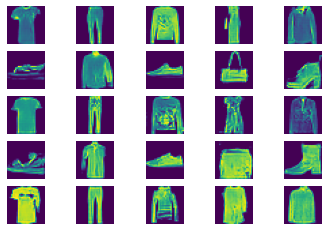

In [221]:
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from keras.models import load_model
from matplotlib import pyplot
 
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)
    # generate labels
    labels = randint(0, n_classes, n_samples)
    return [z_input, labels]
 
# create and save a plot of generated images
def save_plot(examples, n):
    # plot images
    for i in range(n * n):
        # define subplot
        pyplot.subplot(n, n, 1 + i)
        # turn off axis
        pyplot.axis('off')
        # plot raw pixel data
        pyplot.imshow(examples[i, :, :, 0])
    pyplot.show()
 
# load model
model = load_model('cgan_generator.h5')
# generate images
latent_points, labels = generate_latent_points(100, 100)
# specify labels
labels = asarray([x for _ in range(10) for x in range(10)])
# generate images
X  = model.predict([latent_points, labels])
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
save_plot(X, 5)

In [373]:
dataset,_ = load_real_samples()

In [374]:
print(dataset.shape)

(60000, 28, 28, 1)
